In [3]:
import math
import numpy as np
from PIL import Image, ImageDraw, ImageOps, ImageFont
from typing import Union, List

In [4]:
final_dimensions = (220, 220) # px

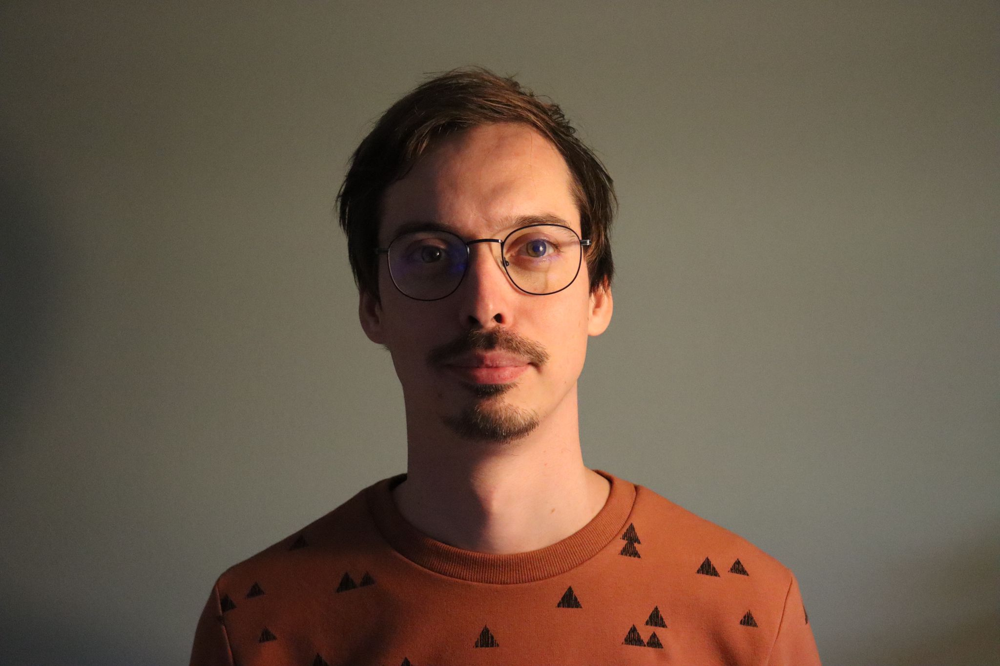

In [5]:
im = Image.open("input.jpg")
display(im)

# Image preprocessing
Crop the image to a exact square

In [6]:
# thanks to: https://www.tutorialspoint.com/python_pillow/Python_pillow_merging_images.htm
def display_two(image1: Image, image2: Image) -> Image.Image: 

    
    #resize, first image
    # image1 = image1.resize((426, 240))
    image1_size = image1.size
    image2_size = image2.size
    new_image = Image.new('RGB',(2*image1_size[0], image1_size[1]), (250,250,250))
    new_image.paste(image1,(0,0))
    new_image.paste(image2,(image1_size[0],0))
    display(new_image)
    #new_image.save("images/merged_image.jpg","JPEG")
    #new_image.show()


In [7]:
# Compute a bounding box based on a center-point and 
# a distance from this point
bouding_box = lambda center, distance: \
    [
        tuple([i - distance for i in center]), 
        tuple([i + distance for i in center])
    ]

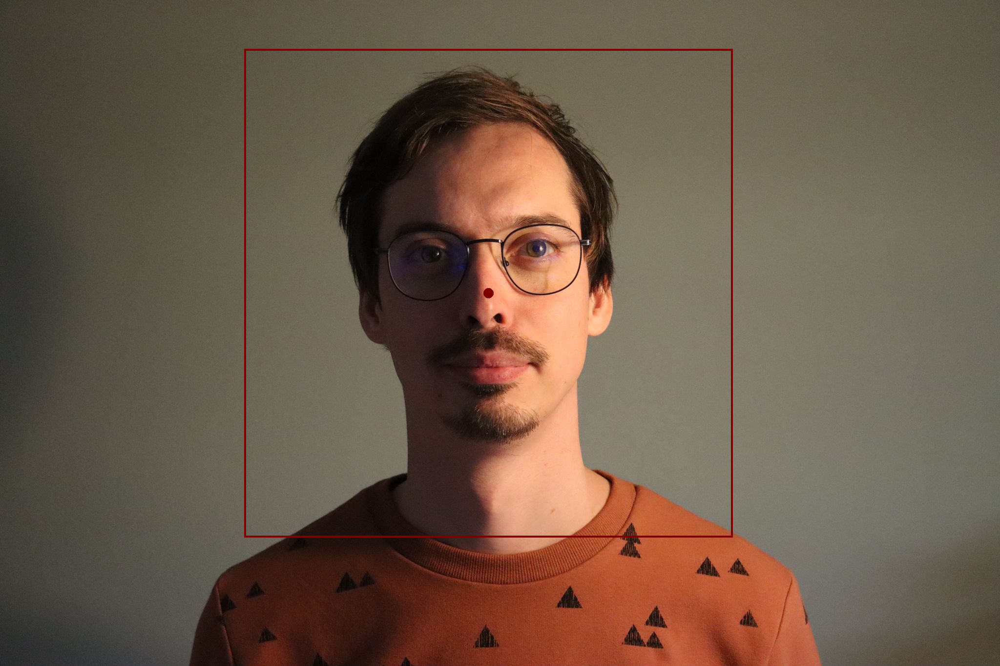

In [8]:
center = [1000, 600]

im2 = im.copy()
draw = ImageDraw.Draw(im2)
draw.ellipse(
    bouding_box(center, 10),
    fill=128
)

draw.rectangle(bouding_box(center, 500), outline=128, width=4)
display(im2)

In [9]:
box = bouding_box(center, 500)
res = box[0] + box[1]
res

(500, 100, 1500, 1100)

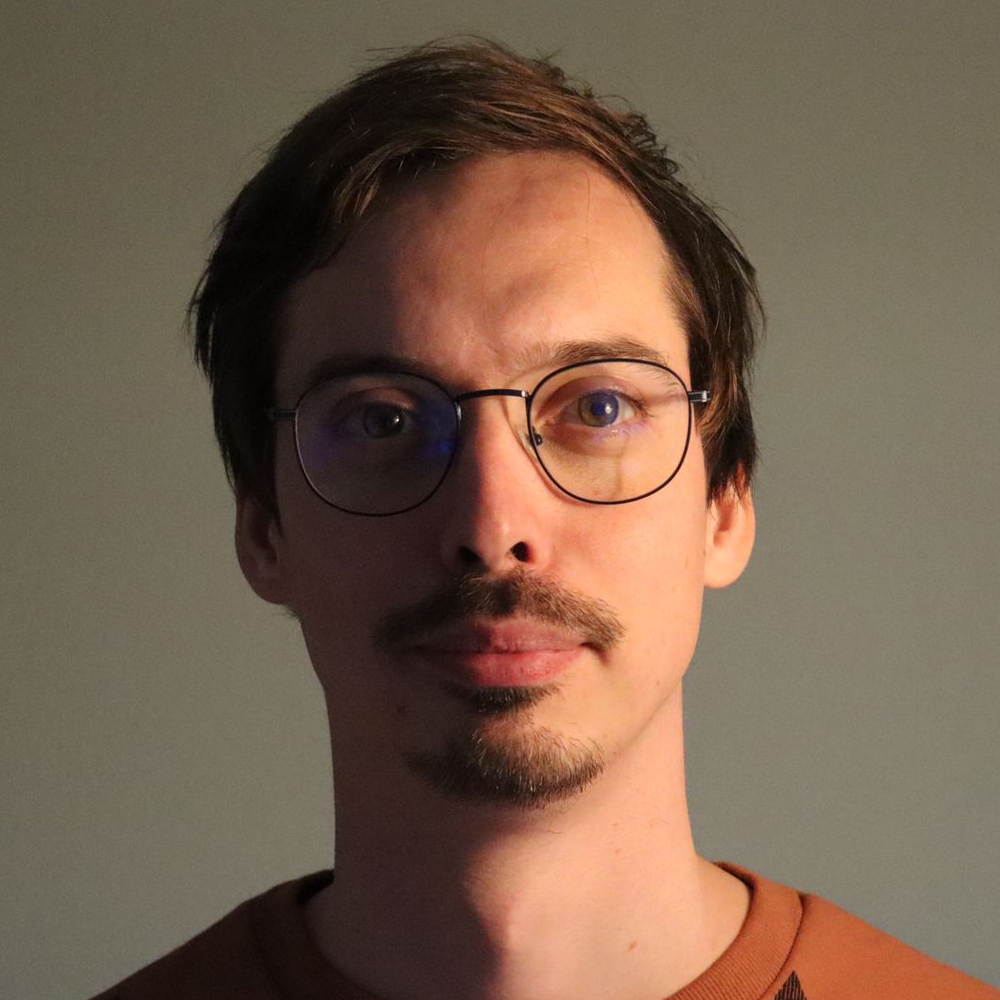

In [10]:
im_cropped = im.crop(res)
display(im_cropped)

# Color Channels
We should have one value per pixel to match with the letter intensity. So we either pick a single color channel, or combine the colors into one. Basically making a grayscale image.

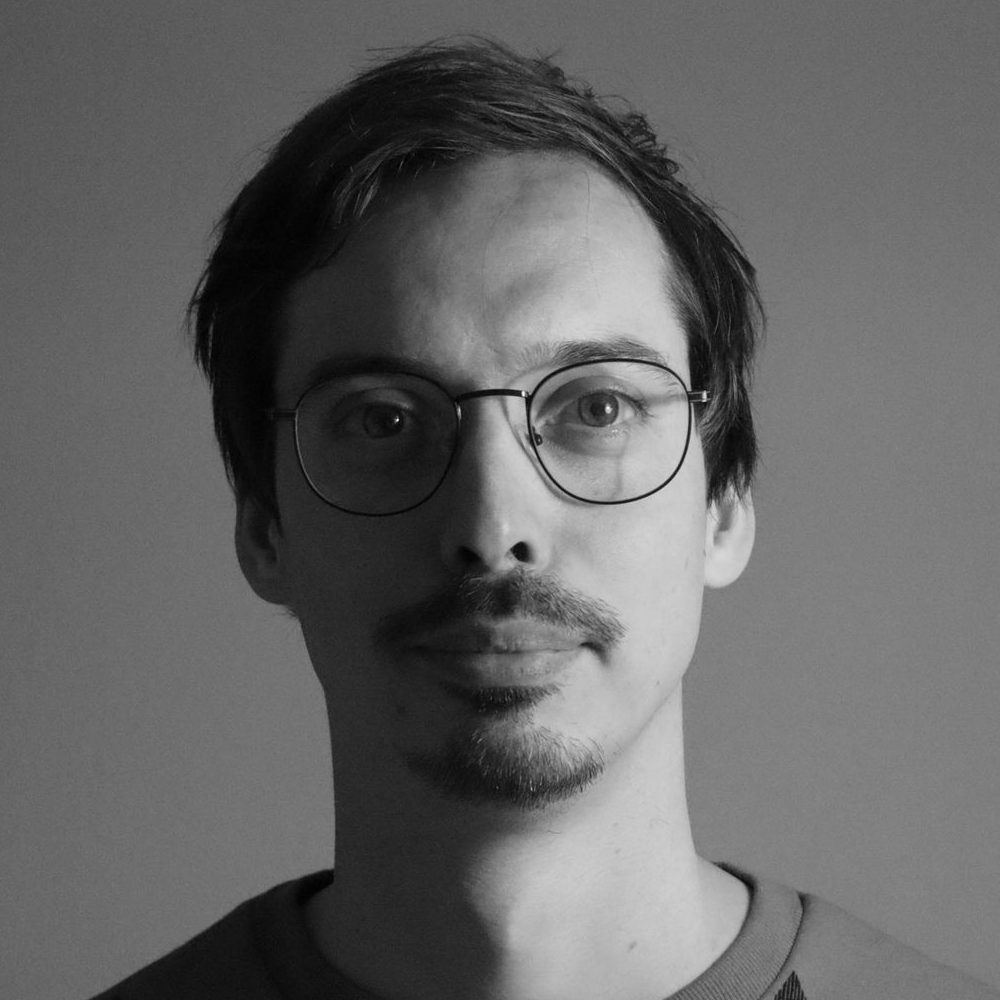

In [11]:
im_cropped.convert("L")

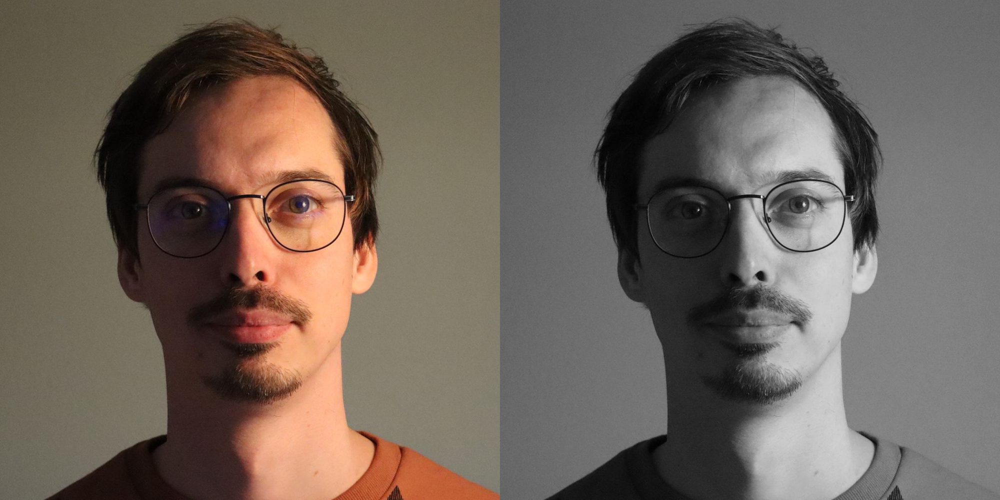

In [12]:
# Simple grayscale image
im_processed = ImageOps.grayscale(im_cropped)

# normalize image
im_processed = ImageOps.autocontrast(im_processed)

display_two(im_cropped, im_processed)

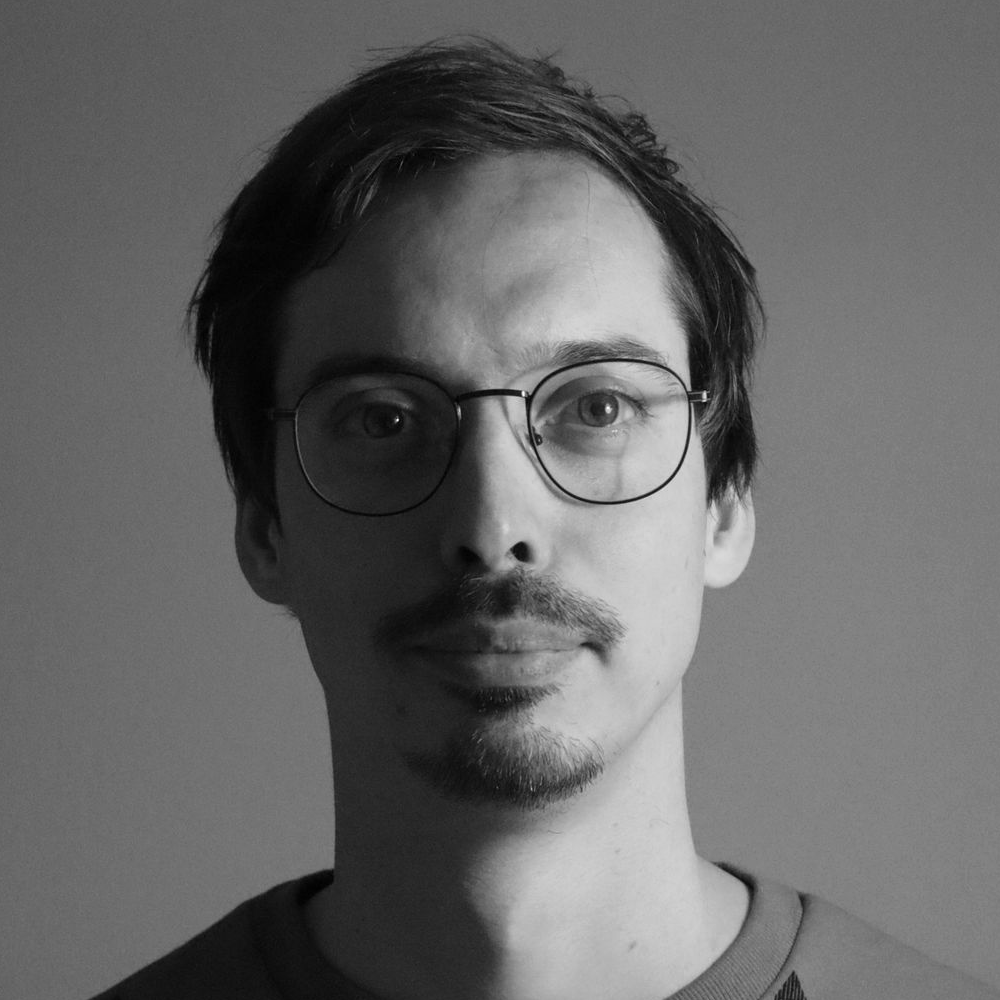

In [13]:
display(im_processed)

# Letter intensity
The idea is that every letter covers an amount of pixels. The more pixels the letter covers, the less intense the 'letter-pixel' is.
This only works for mono spaced fonts
sources: 
https://stackoverflow.com/questions/67916897/how-to-create-images-with-english-alphabets-a-z-a-z-0-9-in-python

In [14]:
import string 

In [15]:
font_size = 150
charactersList=list(string.ascii_letters + string.digits ) + [' ', '!', '?', '.', ',', ':', ';', '(', ')', '[', ']', '{', '}', '/' , '|', '-', '_', '=', '+', '*', '&', '^', '%', '$', '#', '@', '~', '`']
fnt = ImageFont.truetype("fonts/UbuntuMono-Regular.ttf", size=font_size)

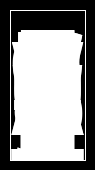

In [16]:
padding = 10
img_dims = (font_size//2+2*padding,font_size+2*padding)
img = Image.new('LA', img_dims, color='black')
d = ImageDraw.Draw(img)
for idx, char in enumerate(charactersList):
    d.text((padding,padding), char, font=fnt, fill=(255,3*idx), align='center')
d.rectangle((padding, padding, font_size//2+padding, font_size+padding), width=1, outline=(255,255))
display(img)

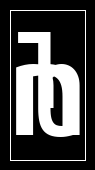

In [17]:
padding = 10
img_dims = (font_size//2+2*padding,font_size+2*padding)
img = Image.new('LA', img_dims, color='black')
d = ImageDraw.Draw(img)
for idx, char in enumerate(charactersList[11:11+3]):
    d.text((padding,padding), char, font=fnt, fill=(255,355), align='center')
d.rectangle((padding, padding, font_size//2+padding, font_size+padding), width=1, outline=(255,255))
display(img)

In [18]:
def compute_letter_intensity(letter: str) -> Union[float, Image.Image]:
    img_dims2 = (font_size//2, font_size)
    img = Image.new('L', img_dims2, color='black')
    d = ImageDraw.Draw(img)
    d.text((0,0), letter, font=fnt, fill=255, align='center')
    
    data = img.getdata()

    n_of_pixels = math.prod(img_dims2)
    avg_intensity = sum(data)/n_of_pixels
    return avg_intensity

In [19]:
compute_letter_intensity('a')

50.65626666666667

In [20]:
intensities = {}
min_ = 0
for char in charactersList:
    intensities[char] = compute_letter_intensity(char)

# scale all values between 0 - 1
low = min(intensities.values())
high = max(intensities.values()) - low 

for k, v in intensities.items():
    intensities[k] = (v - low) / high


# for k, v in intensities.items():
#     intensities[k] = v/high



# Segment picture

In [21]:
n_segments = 110
(img_w, img_h) = im_processed.size
ds = img_w // n_segments

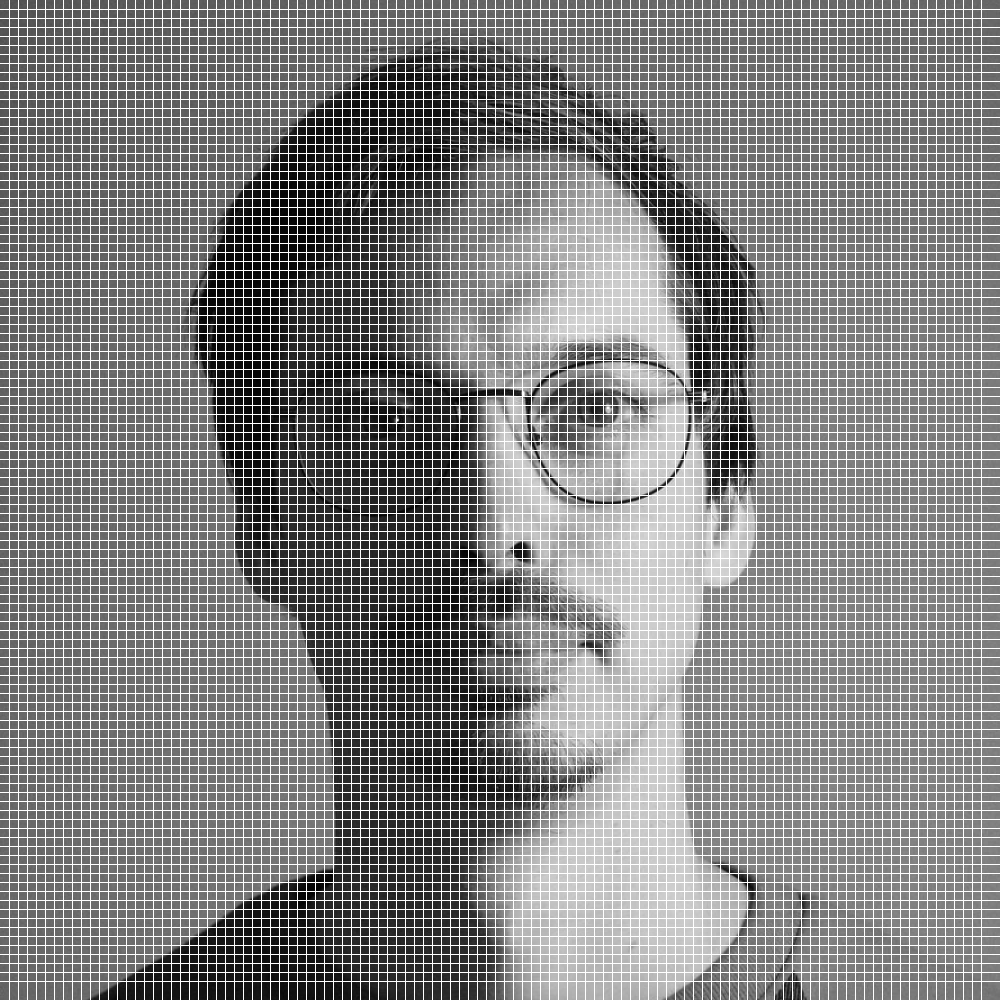

In [22]:
im_processed2 = im_processed.copy()

d = ImageDraw.Draw(im_processed2)
for i in range(1, n_segments):
    d.line((0, i*ds, img_h, i*ds), fill=255)
    d.line((i*ds, 0, i*ds, img_h), fill=255)

display(im_processed2)

In [23]:
def display_many(images: List[Image.Image], 
                 dim: tuple=(1, 1)) -> Image.Image:
    
    assert math.prod(dim) == len(images), 'Thats not a grid'
    n, m = dim
    img_w, _ = images[0].size

    new_image = Image.new('L', ((n)*img_w+n+1, (m)*img_w+m+1), 255)
    
    for i in range(1,n+1):
        for j in range(1,m+1):
            idx = (i-1)*m + (j-1)
            new_image.paste(images[idx], ((j-1)*img_w+(j), (i-1)*img_w+(i)))
    
    return new_image
    

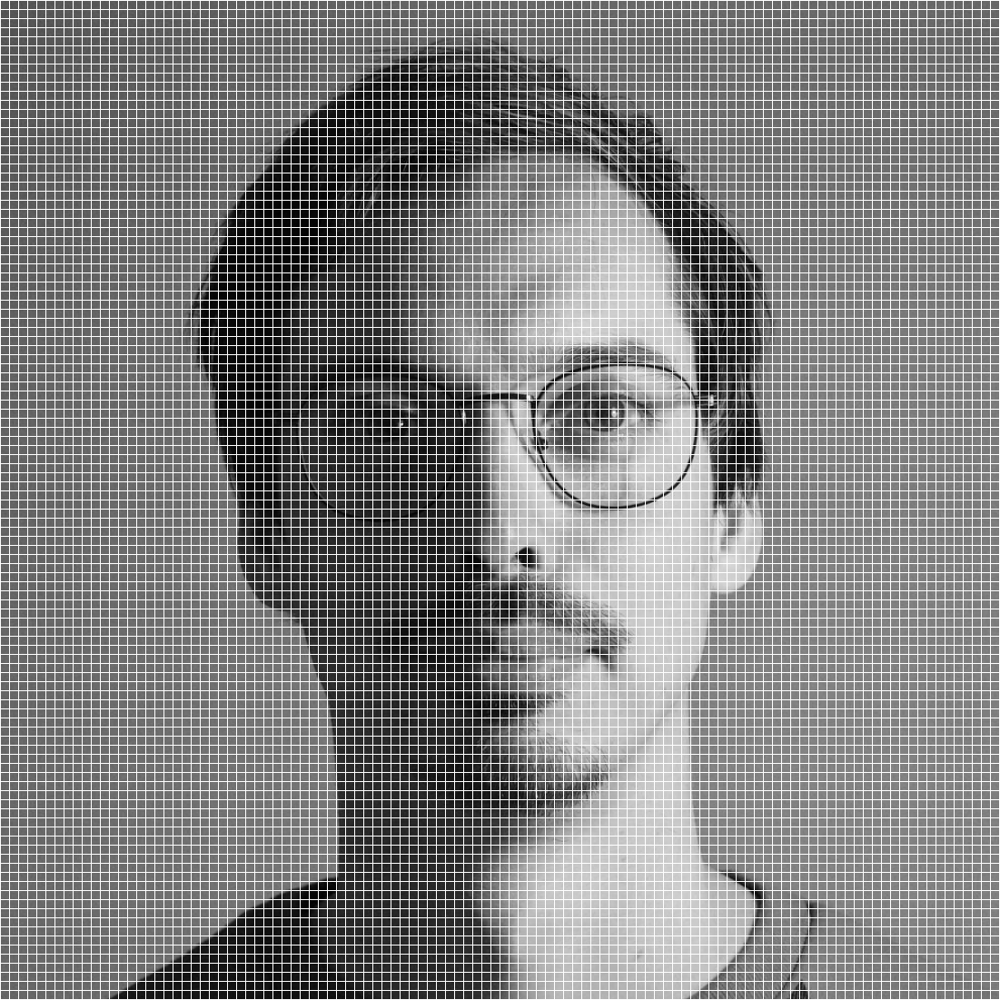

In [24]:
im_part = im_processed.copy()

segments = []

for i in range(n_segments):
    for j in range(n_segments):
        segments.append(
            im_part.crop((j*ds,i*ds,(j+1)*ds,(i+1)*ds))
        )

# stich segments back to a single image
display_many(segments, (n_segments, n_segments))

In [25]:
segment_average = []
for segment in segments:
    raw_data = segment.getdata()
    segment_average.append(sum(raw_data)/len(raw_data)/255)


In [26]:
from matplotlib import pyplot

Text(0.5, 1.0, 'Segment intensities')

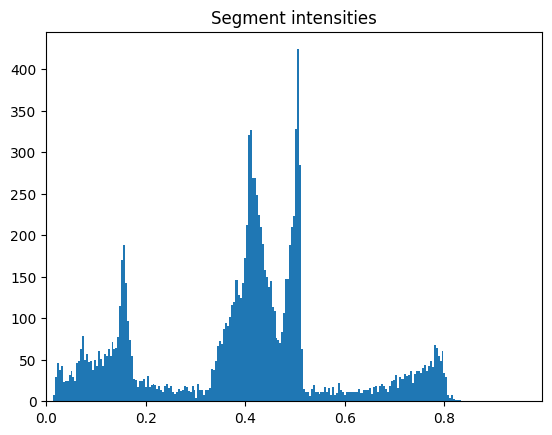

In [27]:
hist, edges = np.histogram(segment_average,np.arange(0.0, 1.0, 1/255))
pyplot.bar(edges[:-1], hist, width=1/255)
pyplot.xlim(min(edges), max(edges))
pyplot.title('Segment intensities')

In [28]:
segment_average[0]

0.3326071169208424

In [30]:
chars = []
for objective in segment_average:
    chosen_char = '*'
    distance = 1
    for char, intensity in intensities.items():
        di = abs(objective - intensity)
        if di < distance:
            chosen_char = char
            distance = di
    chars.append(chosen_char)



In [31]:
result_string = ''.join(chars)
n = n_segments
lines = [result_string[i:i+n] for i in range(0, len(result_string), n)]

In [32]:
font_size2 = 12
charactersList=['.',',','/','?','$','a','b','c','d','e','f','g','h','i','j','k','l','m','n','o','p','q','r','s','t','u','v','w','x','y','z','A','B','C','D','E','F','G','H','I','J','K','L','M','N','O','P','Q','R','S','T','U','V','W','X','Y','Z','0','1','2','3','4','5','6','7','8','9']
fnt2 = ImageFont.truetype("fonts/UbuntuMono-Regular.ttf", size=font_size2)

In [33]:
for line in lines:
    print(line)

rrrrr++r++++++*****==============??????????????????||||?||||||||||||||||||||||||||||||||||||||||||||||||||||||
rrrrr+++++++++*********==========??????????????????|?|||||||||||||||||||||||||||||||||||||||||||||||||||||||||
rrrrrrr++++++++*****===========????????????????????????|||||||||||||||||||||||||||||||||||||||||||||||||||||||
rrrrrr++++++++**+***=*=====?====??????????????????==*??|||||||||||||||||||||||||||||||||||||||||||||||||||||||
rrrrr+++++++++**+*==========??=????????????????+++=*+rr=||||||||||||||||||||||||||||||||||||||||||||||||||||||
rrrrrr++++++++*****=========????????????=*+++^:!:::::!!!r?|????|||||||||||||||||||||||||||||||||||||||||||||||
rrrr++++++++++***=*========????????????==+r;:,,..,~~~~:!!!r^^*?|||||||||||||||||||||||||||||||||||||||||||||||
rrr+r++++*++++***=*=======?=???????????=r!,....,.,_,~,,~_!!:::*|||||||||||||||||ii||||||||i|||||||||||||||||||
r+r++++++*+********=====?===??????????=!,.-````----...,~~~::~,!=?||||||||||i||i||i||||||i||||||i||||||||||||||
r

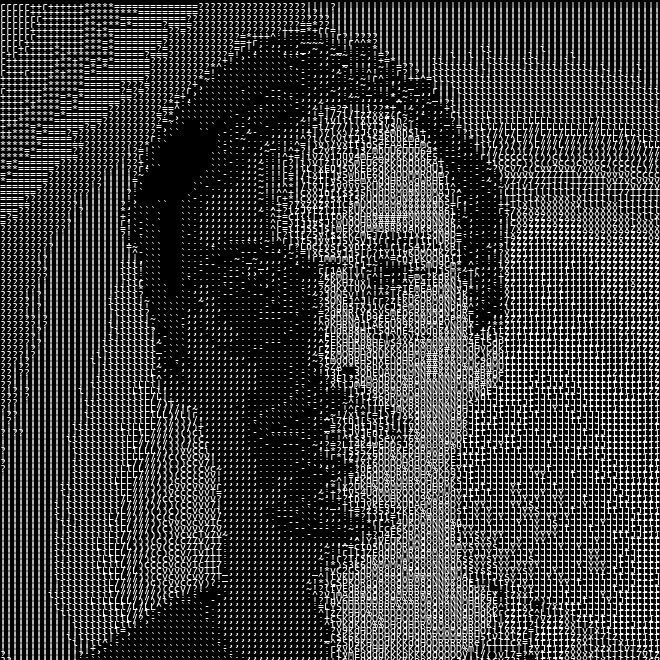

In [34]:
res = Image.new('L', (660, 660), 0)
d = ImageDraw.Draw(res)
for idx, line in enumerate(lines):
    d.text((0,idx*6), line, font=fnt2, fill=255, align='center')
    
display(res)